# Identification
Please indicate your name

Student 1: Simon GROC

Student 2: Imane HIBAOUI

# Practical work 4: Frequency filtering, color

In [1]:
import numpy as np
from numpy.fft import fft2,ifft2,fftshift
import matplotlib.pyplot as plt
from PIL import Image

def imshow(I,title=None,size=500):
    """ display an image with a specific size """
    plt.figure(figsize=(size//80,size//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()


## Exercise 1 - Frequency filtering

1. Compute than display the centered module of Fourier transform of `img/mandrill.png` (use functions seen in previous lessons). 

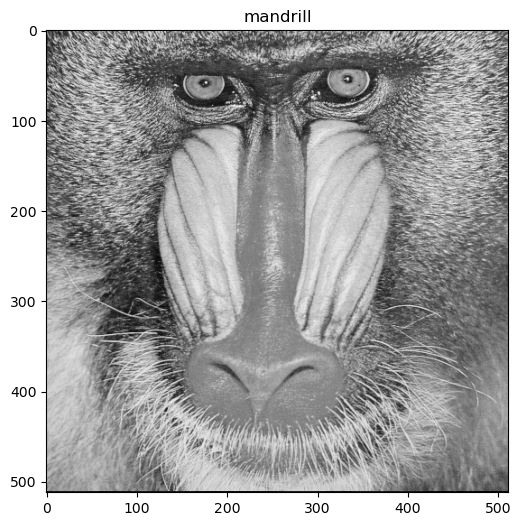

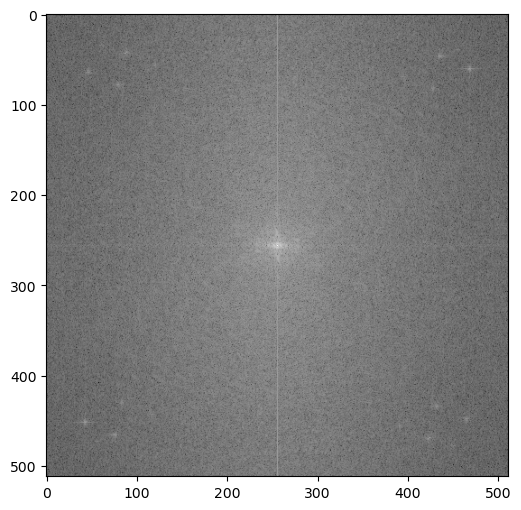

In [2]:
mandrill = np.array(Image.open("img\\mandrill.png"))
mandrillTF = fft2(mandrill)
mandrillTF = np.log(np.abs(fftshift(mandrillTF))+1)
imshow(mandrill, "mandrill")
imshow(mandrillTF)

2. Write a function `idealLowPassFilter(n,m,fc)` returning an ideal low pass filter with frequency cutoff $f_c$ and size $n\times m$. Recall: this function set to 1 pixels at Euclidian distance $f_c$ from the center (null frequency).

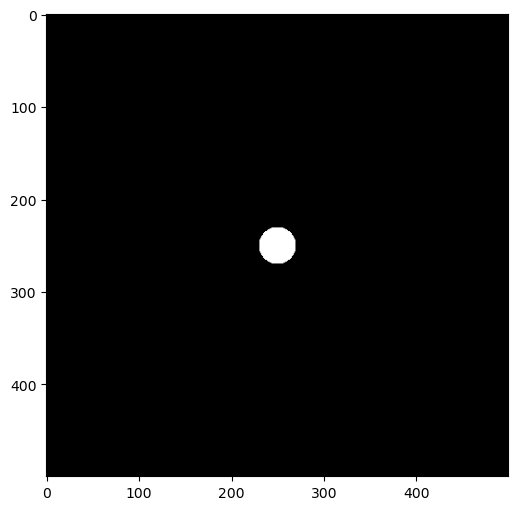

In [3]:
def idealLowPassFilter(n,m,fc):
    idealLow = np.zeros((n,m))
    midn = n//2
    midm = m//2
    for i in range(midn-fc, midn+fc):
        for j in range(midm-fc, midm+fc):
            if np.sqrt((i-midn)**2+(j-midm)**2)< fc:
                idealLow[i, j] = 1
    return idealLow
imshow(idealLowPassFilter(500,500,20))

        

3. Write a function `lowPass(I,fc)` performing a low pass filtering of an image $I$. The function should
 - compute the centered Fourier transform of $I$
 - multiply point-by-point the spectrum with the ideal low filter produced by `idealLowPassFilter()`
 - uncenter the filtered spectrum and apply the inverse Fourier transform (use function `ifft2()` from module `numpy.fft`)
 - return the real part of filtered image

In [4]:
def lowPass(I,fc):
    img = np.array(Image.open(I))
    imgTF = fft2(img)
    imgTF = fftshift(imgTF)
    #imgTF = np.log(np.abs(fftshift(imgTF))+1)
    n, m = img.shape
    ideal = idealLowPassFilter(n, m, fc)
    lowImgTF = imgTF*ideal
    lowImgTF = fftshift(lowImgTF)
    newImgInv = ifft2(lowImgTF)
    return newImgInv.real

    
    

4. Experiment this function on `img/mandrill.png` and `img/lena.jpg` with various values of cut off $f_c$.
 - give two effects that appears when $f_c$ decreases,
 - propose two applications of this filtering.


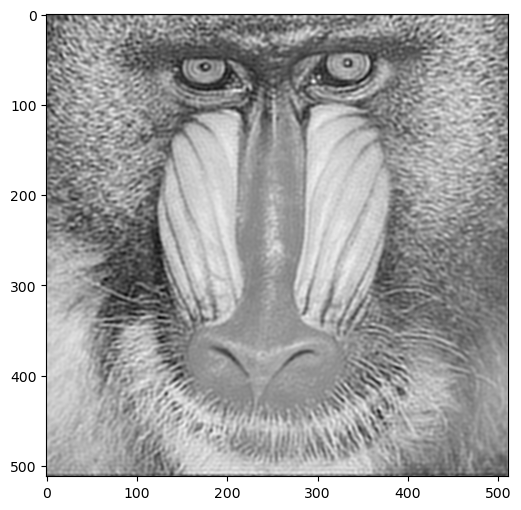

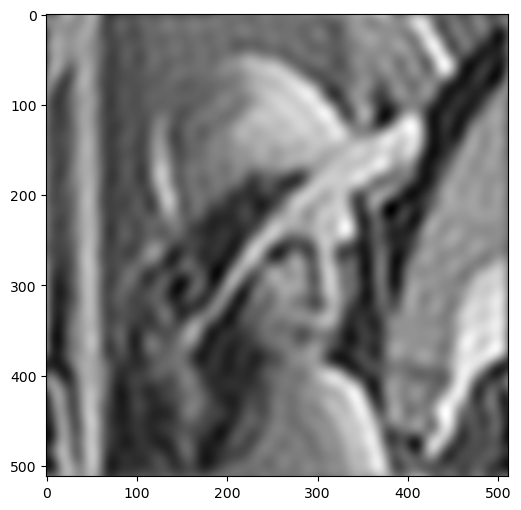

In [5]:
lowmandrill =lowPass("img/mandrill.png", 100)
lowlena =lowPass("img/lena.jpg", 20)
imshow(lowmandrill)
imshow(lowlena)


## Exercise 2 -  Linear filtering (convolution)

1. Given a kernel convolution of size $d\times d$, $d$ being odd. How many lines and columns should be added to each side of the image to apply this filter? The image is supposed surrounded by zero values.

comme $d$ et un nombre impaire et que lon centre le filtre sur le pixelle interecer on peux jut ajouter ($d$-1)/2 ligne et collone 

2. Write a function `imagePad(I,h)` getting an image and a kernel, returning a new image padded with zeros according to question 1. It is not allowed to use a module implementing the padding.

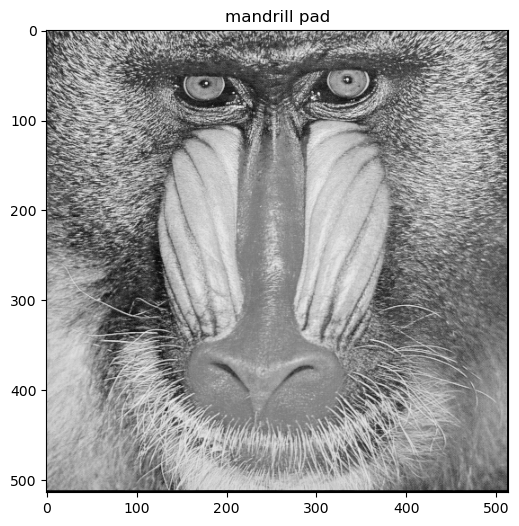

In [6]:
def imagePad(I, h):
    # Obtenez les dimensions de l'image
    n, m = I.shape[:2]
    border_size = h.shape[0]//2
    # Créez une nouvelle image avec une bordure noire
    new_n = n + 2 * border_size
    new_m = m + 2 * border_size
    img_pad = np.zeros((new_n, new_m), dtype=np.uint8)
    
    # Copiez l'image d'origine dans le centre de la nouvelle image
    img_pad[border_size:border_size + n, border_size:border_size + m] = I
    
    return img_pad


imshow(imagePad(mandrill,np.array(([1,1,1],[1,1,1],[1,1,1]))), "mandrill pad")

3. Write a function `conv2(I,h)` getting an image and a kernel and returning the convolution of $I$ by $h$. The function should return an image having the same shape than $I$. It is not allowed to use a module implementing the convolution.

In [21]:
def conv2(I,h):
    I_pad = imagePad(I, h)
    n, m = I.shape
    new_I = np.zeros((n, m))
    nh, mh= h.shape
    border = nh//2
    h_prim = np.zeros((nh, mh))
    for i in range(nh):
        for j in range(mh):
            h_prim[i, j] = h[nh-i-1, mh-j-1]
    for i in range(n):
        for j in range(m):
            new_I[i, j] = np.sum(I_pad[i:i+nh, j:j+nh]*h_prim)
    return new_I

    

4. Try this function on mean filter of size $3\times3$, $5\times 5$ and $7\times 7$. Discuss the results.

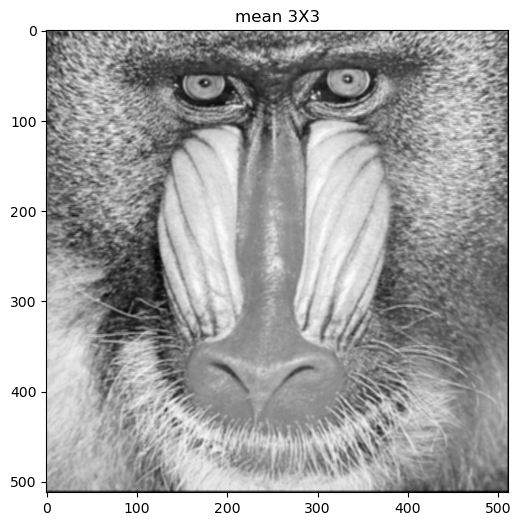

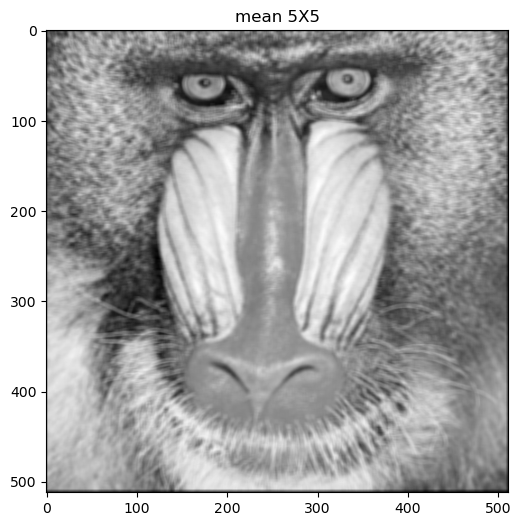

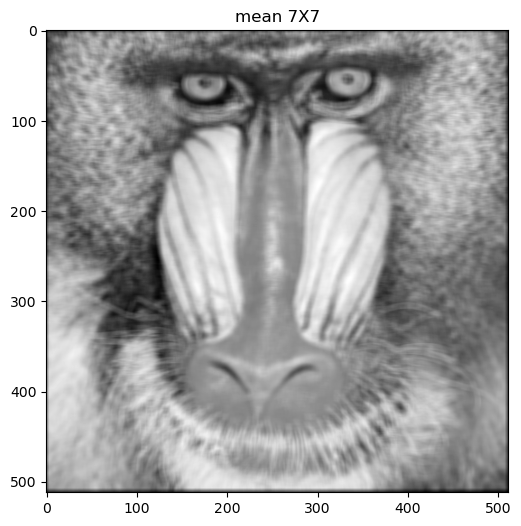

In [22]:
imshow(conv2(mandrill,np.ones((3, 3))/9), "mean 3X3")
imshow(conv2(mandrill,np.ones((5, 5))/9), "mean 5X5")
imshow(conv2(mandrill,np.ones((7, 7))/9), "mean 7X7")
# On peut voir que le filtre moyenneur élimine les hautes fréquences de l'image en calculant la moyenne des valeurs locales pour chaque pixel

5. Display the transfert function of these mean filters. For a better visualization, use the zero-padding technique to obtain a filter with a large size (for instance $256\times 256$). Use `imshow()` and `toVisualizeLogFT()`.

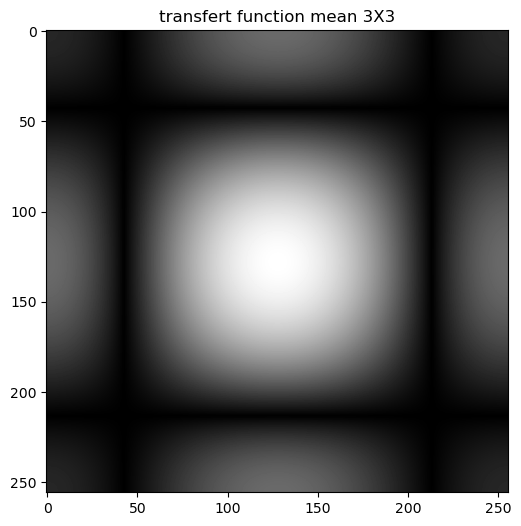

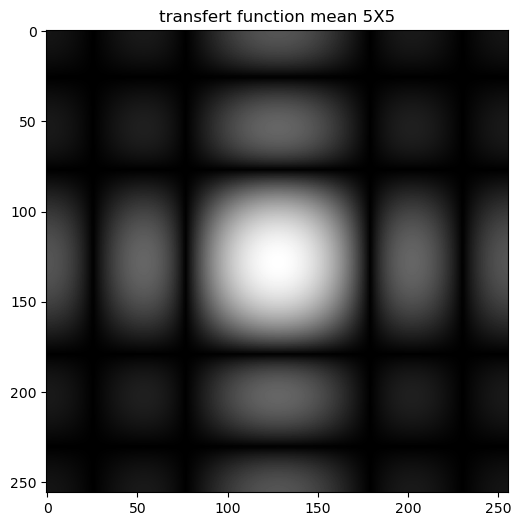

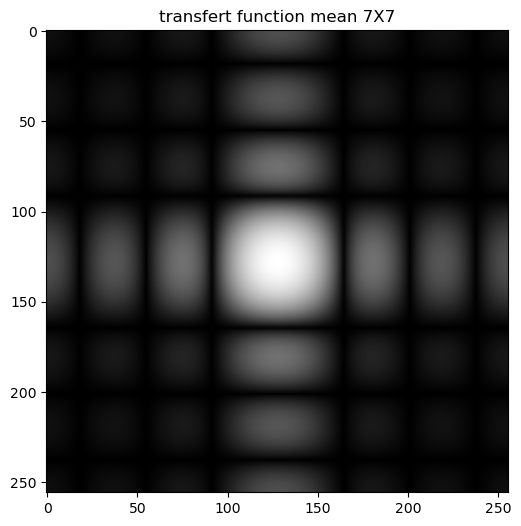

In [9]:
def toVisualizeLogFT(h):
    nh, mh = h.shape
    tf_filter = np.zeros((256, 256))
    center_pos = (256-nh)//2
    tf_filter[center_pos:center_pos+nh, center_pos:center_pos+mh] = h
    tf_filter = fftshift(fft2(tf_filter))
    tf_filter = np.log(np.abs(tf_filter)+1)
    return tf_filter
imshow(toVisualizeLogFT(np.ones((3, 3))/9), "transfert function mean 3X3")
imshow(toVisualizeLogFT(np.ones((5, 5))/9), "transfert function mean 5X5")
imshow(toVisualizeLogFT(np.ones((7, 7))/9), "transfert function mean 7X7")
    

6. Interpretation: what is the analytic expression of the transfert function of a mean filter? Is  it an ideal low pass filter?

$$
H(u, v) = \frac{\sin(\pi u N)}{\pi u N} \cdot \frac{\sin(\pi v N)}{\pi v N} = \text{sinc}(\pi u N) \cdot \text{sinc}(\pi v N)
$$
Sais la trenfomer de fourier d'une fonctions rectenguler uniforme comme la fonctions porte qui dans le dommene frecensielle en deux dimentions est representer par deux fonctions $ \text{sinc} $ et cette fonctions ne represent pas un filtre passe bas ideale en effer les atenus les haute frecense sans les surprimer. De plus comme la fonctions $\text{sinc}$ posede des segons l'obe sa peux introduire des atefacte.


7. Bonus question: perform the same study for the Gaussian kernel. Determine $\sigma$ in order to have filter of size $3\times3$, $5\times5$, and $7\times7$.

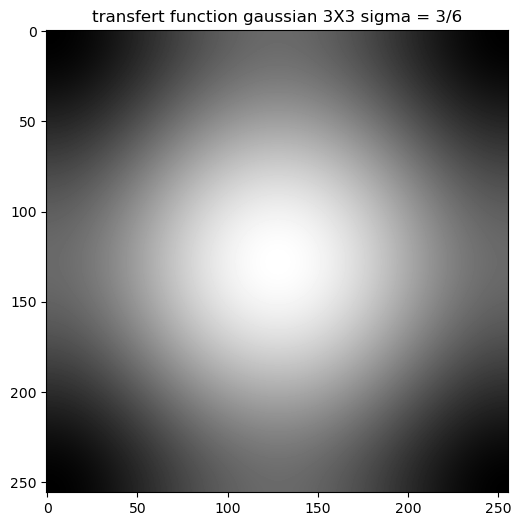

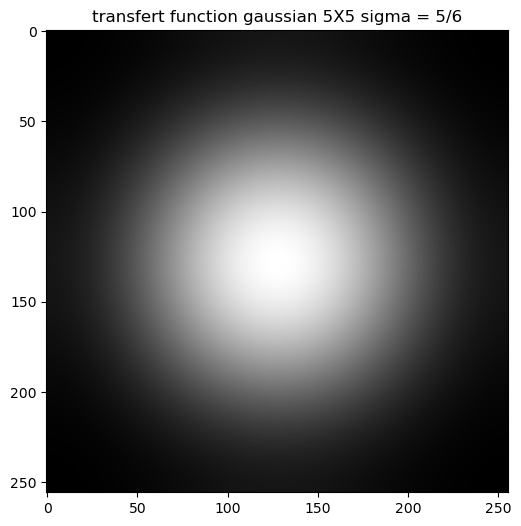

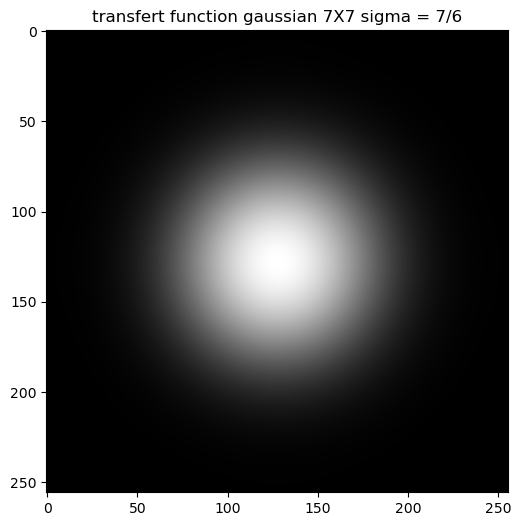

In [10]:
def gaussianKernel(sigma):
    """ double -> Array
        return a gaussian kernel of standard deviation sigma
    """
    n2 = int(np.ceil(3*sigma))
    x,y = np.meshgrid(np.arange(-n2,n2+1),np.arange(-n2,n2+1))
    kern = np.exp(-(x**2+y**2)/(2*sigma*sigma))
    return  kern/kern.sum()
#on divise pare 6 la taille N d'une face du noyeux car cassiment tous l'informations est dans un intervale de 3 sigma comme on a 3 sigma de chaque coter en positfe et en negatif on divise par la longeur en sigma sois 6
imshow(toVisualizeLogFT(gaussianKernel(3/6)), "transfert function gaussian 3X3 sigma = 3/6")
imshow(toVisualizeLogFT(gaussianKernel(5/6)), "transfert function gaussian 5X5 sigma = 5/6")
imshow(toVisualizeLogFT(gaussianKernel(7/6)), "transfert function gaussian 7X7 sigma = 7/6")



le filtre gautiens et un filte pas bas mais il nais pas ideale cas il diminus progesivement sependans a la diference du filter moyenner il nitroduis pas de artefacte care sa deriver ne posede pas de segons membre.

## Exercise 3: anti aliasing filtering

1. Give a code that subsamples of factor 2 (use function `subSample2()` given in TME3) the image `img/barbara.png`.

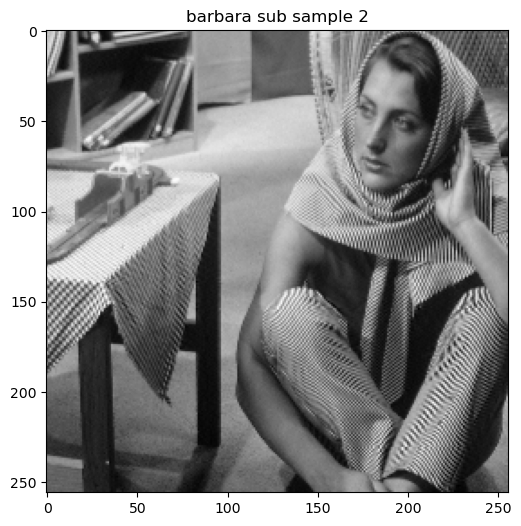

In [11]:
def subSample2(img):
    # Subsample image by taking every second pixel
    return img[::2, ::2]
barbara = np.array(Image.open("img/barbara.png"))
imshow(subSample2(barbara), "barbara sub sample 2")

2. Give a code that subsamples of factor 2 (use function `subSample2()`) the image `img/barbara.png` after applying an low pass filter (use `antiAliasingFilter()`). As comment, recall the principle of filtering in the frequency domain.

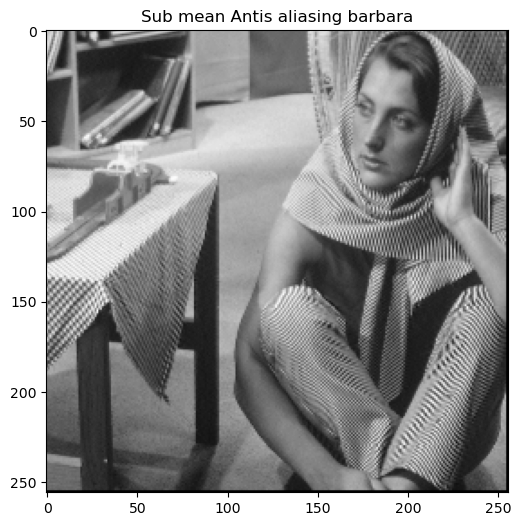

In [12]:
def antiAliasingFilter(n,m):
    """ int*int -> Array Dans le dommene frecencielle le filtraje d'une image consite a apliquer la transphormer de fourier au filtre(kernel) pour touver son spectre
    et multiplis a multiplier sont spectre dans a seluis de l'image avent de apliquer la tranformet de fourier inverse au spectre resulten pour auptenir l'image filter."""
    n2, m2 = n//2, m//2
    rn, rm = n//4, m//4
    A = np.zeros((n, m))
    A[rn:rn+n2, rm:rm+m2] = 1
    return A
imgSub = subSample2(barbara)
imgSubMean =conv2(imgSub,np.ones((3, 3))/9)
n, m = imgSubMean.shape
antiAliasing = antiAliasingFilter(3,3)
imgSubMeanAntiAliasing =conv2(imgSub,antiAliasing)
imshow(imgSubMeanAntiAliasing, "Sub mean Antis aliasing barbara")





3. Describe and analyze the filtering of Barbara with and without the anti aliasing filter. What information is lost for the two filtered images ?

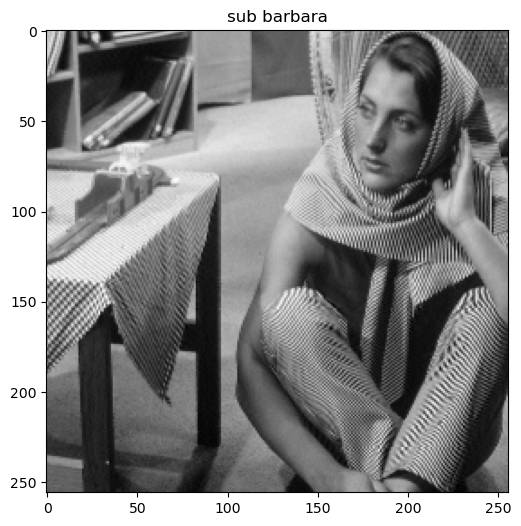

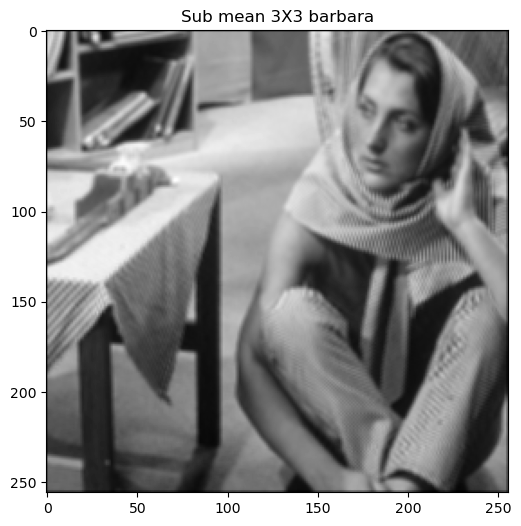

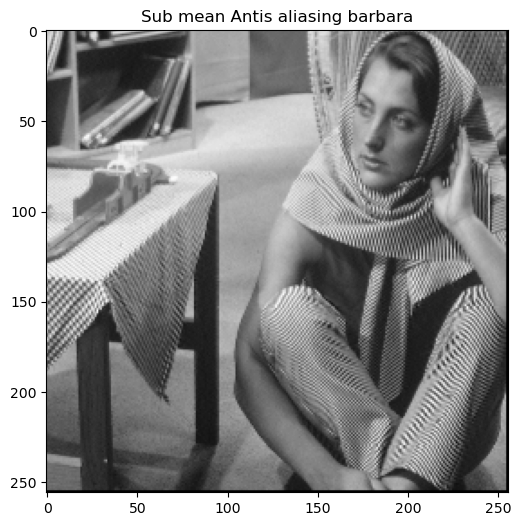

In [13]:
imshow(imgSub, "sub barbara")
imshow(imgSubMean, "Sub mean 3X3 barbara")
imshow(imgSubMeanAntiAliasing, "Sub mean Antis aliasing barbara")

On peux vois que on recuper cetins contour apret l'aplications du filte anits aliasing mais que les plus haute frequenc sons toujour perdus.

## Exercise 4: color image
1. Read images `img/clown.bmp` and `img/clown_lumi.bmp` as two arrays named $I_1$ and $I_2$. Display these images and examine their shape. What difference there are between them?

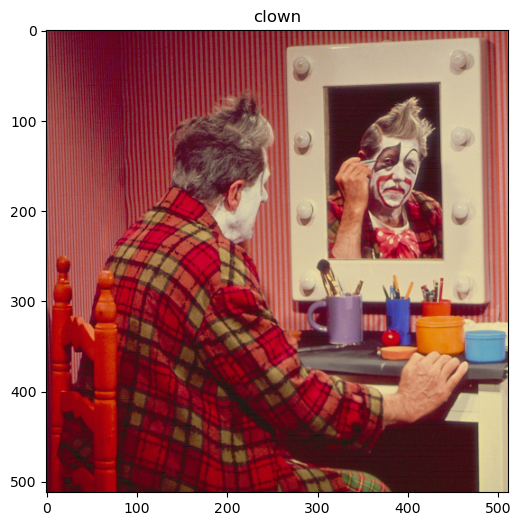

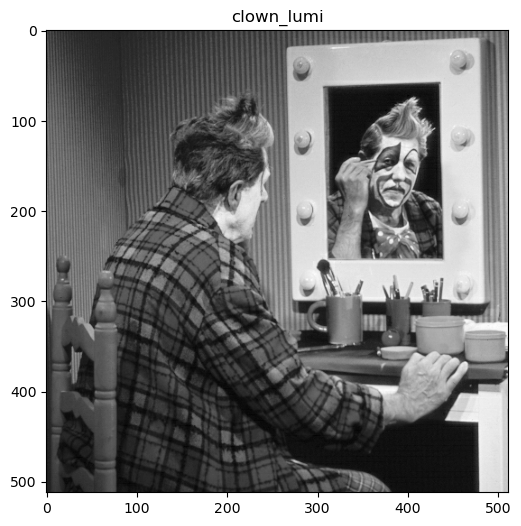

In [15]:
clown = np.array(Image.open("img/clown.bmp"))
clown_lumi = np.array(Image.open("img/clown_lumi.bmp"))
imshow(clown, "clown")
imshow(clown_lumi, "clown_lumi")
#On remarque que la première image comporte 3 canaux pour représenter les couleurs rouge, vert et bleu (RGB), 
# tandis que la seconde ne possède qu'un seul canal pour les nuances de gris.

2. The first image is an array of dimension 3. Explain the signification of each dimension. From this image create 3 images $I_R$, $I_G$, $I_B$ of dimension 2. Display these three images and explain what you see.

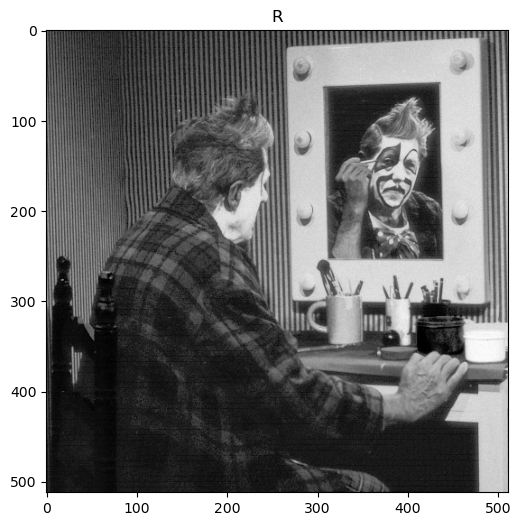

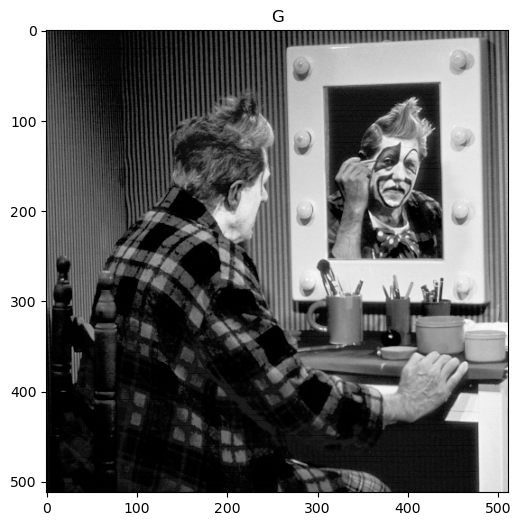

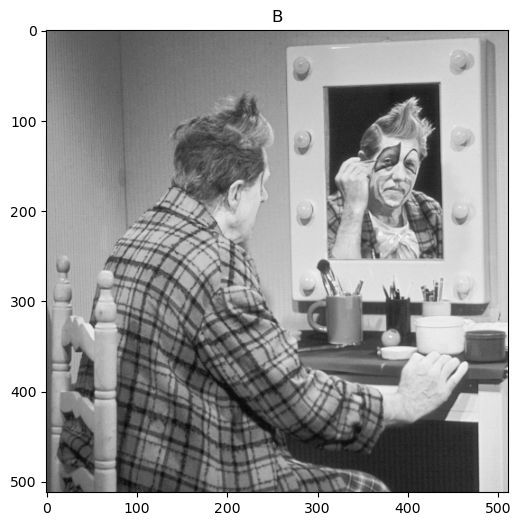

In [16]:
#Comme expliqué précédemment, la première image dispose de trois canaux : rouge, vert et bleu (RGB). 
# Il est donc possible d'obtenir une image distincte pour chacune de ces couleurs.
B = clown[:,:,0]
G = clown[:,:,1]
R = clown[:,:,2]
imshow(R, "R")
imshow(G, "G")
imshow(B, "B")

#Les couleurs sont organisées dans l'ordre B, G, R (bleu, vert, rouge). 
# On peut l'observer en comparant l'intensité de chaque canal avec l'image d'origine pour chacune des couleurs


3. Create a new image $I_3$ of dimensions 3, the first dimension contains the value of $I_R$, the second the value of $I_B$ and the third the values of $I_G$. Try another combinations. Remark: color images are better handled by `imshow()` if pixel values range in $[0,1]$.

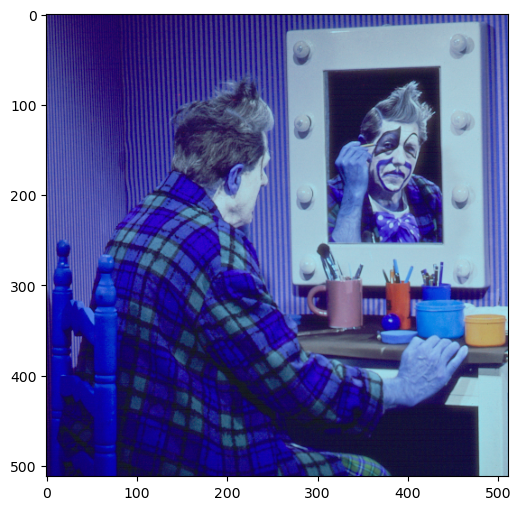

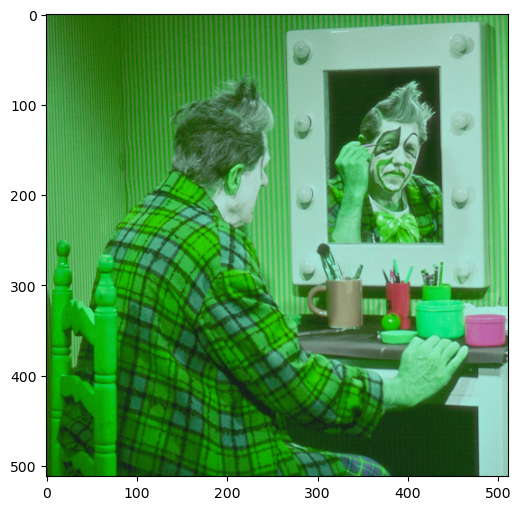

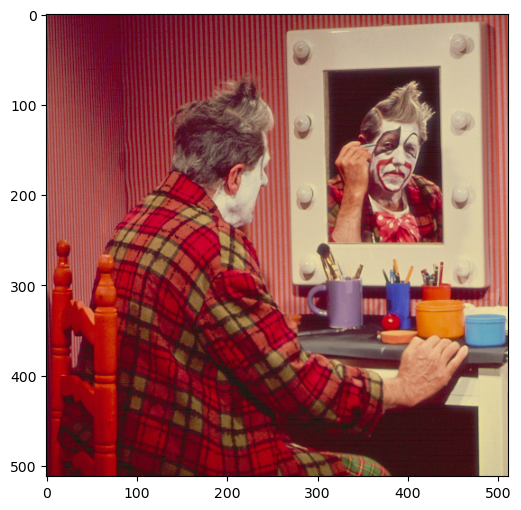

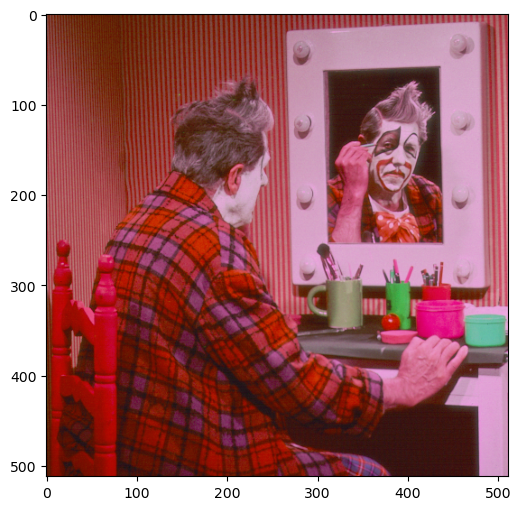

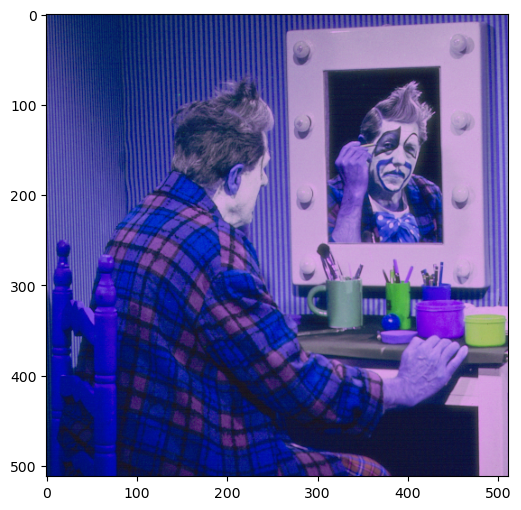

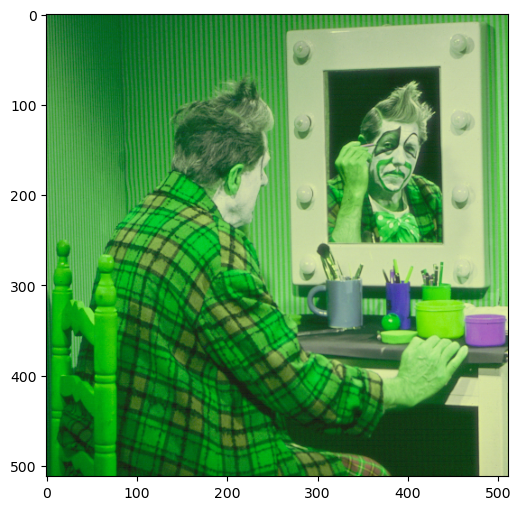

In [17]:
Ir = np.expand_dims(R, axis=2) 
Ig = np.expand_dims(G, axis=2) 
Ib = np.expand_dims(B, axis=2) 
I3 = np.concatenate((Ir, Ig, Ib), axis=2)
I4 = np.concatenate((Ir, Ib, Ig), axis=2)
I5 = np.concatenate((Ib, Ig, Ir), axis=2)
I6 = np.concatenate((Ib, Ir, Ig), axis=2)
I7 = np.concatenate((Ig, Ir, Ib), axis=2)
I8 = np.concatenate((Ig, Ib, Ir), axis=2)


imshow(I3)
imshow(I4)
imshow(I5)
imshow(I6)
imshow(I7)
imshow(I8)

4. Write a code that allows the see the first channel with red color scales, the second channel in green color scales, and the blue channel in blue color scales.

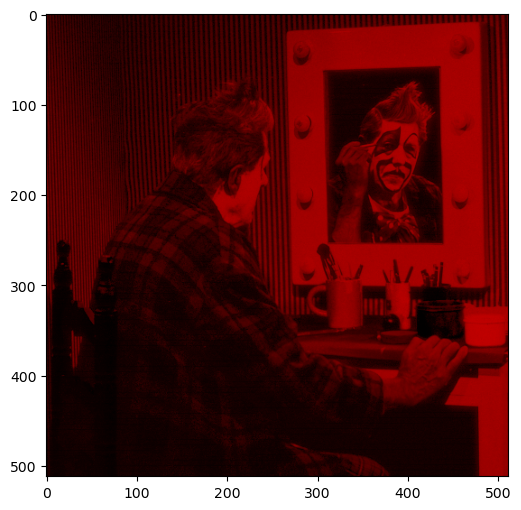

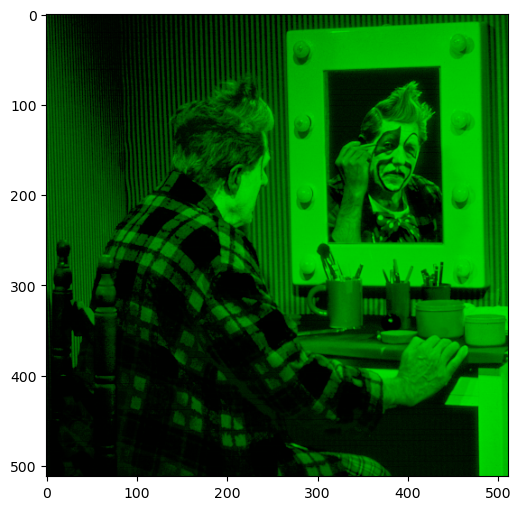

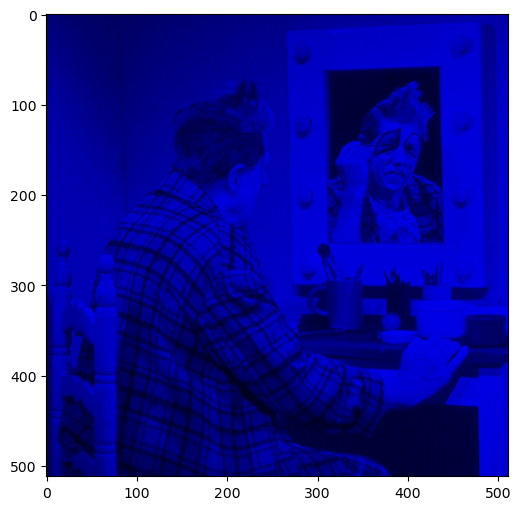

In [18]:
def seeCanal(canal, color):
    imgColor = np.expand_dims(canal, axis=2) 
    otherColor = np.zeros((canal.shape[0], canal.shape[1], 1), dtype=np.uint8)
    new_img = np.copy(otherColor)
    if color == "R":
        new_img = np.concatenate((imgColor, otherColor, otherColor), axis=2)
    if color == "G":
        new_img = np.concatenate((otherColor, imgColor, otherColor), axis=2)
    if color == "B":
        new_img = np.concatenate((otherColor, otherColor, imgColor), axis=2)
    return new_img

imshow(seeCanal(R, "R"))
imshow(seeCanal(G, "G"))
imshow(seeCanal(B, "B"))